# A new bakery in Vienna

## Introduction

The topic is a search for a good place in Vienna to open a new bakery. For this we make an analysis of the population density in comparison with density of bakeries in each district of Vienna.

## Used data and sources

Different data sources are used. The borders of the districts in Vienna are imported from a geojson file: [GeoJson of borders of the districts](https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:BEZIRKSGRENZEOGD&srsName=EPSG:4326&outputFormat=json)

The borders of Vienna itself are taken from another geojson file: [GeoJson of Vienna](https://wahlen.strategieanalysen.at/geojson/json_original.7z)

District specific data on the population and area are scraped from the following Wikipedia page: [Wikipedia table with district specific data](https://de.wikipedia.org/wiki/Wiener_Gemeindebezirke#Bezirke_und_Bezirksteile)

The data on the locations of existing bakeries is queried from Foursquare below.

## Import necessary packages

In [1]:
import os
import pickle
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import HTML, display
plt.style.use('ggplot')

import re
import requests as rq
from bs4 import BeautifulSoup as bs

import folium
from geopy.geocoders import Nominatim
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

%matplotlib inline

## Get a coordinate grid over Vienna for reading in from Foursquare

Instead of using the center of each district to read bakery data from Foursquare, a finer coordinate grid is applied. For this we start by reading in the district borders:

In [2]:
with open('bezirksgrenzen_wien.json', 'rb') as file:
    json_data = json.load(file)

And create a polygon representing Vienna:

In [3]:
with open('gemeinden_95_geo.json', 'rb') as file:
    tmp_json = json.load(file)
poly_vienna = Polygon(tmp_json['features'][1509]['geometry']['coordinates'][0])

The grid can then be simply created by the following code:

In [4]:
nom = Nominatim(user_agent='FunnyAustrian')
latlong_vienna = nom.geocode('Österreich, Wien')#'Österreich, Wien' is German for 'Austria, Vienna'
lat_vienna = latlong_vienna.latitude
lng_vienna = latlong_vienna.longitude

rangeN = 10
delta = 0.02
coord_grid = []
for ind1 in range(-rangeN,rangeN+1):
    for ind2 in range(-rangeN,rangeN+1):
        coords = [lat_vienna+delta*ind1, lng_vienna+delta*ind2]
        if Point([coords[1], coords[0]]).within(poly_vienna):
            coord_grid.append(coords)

Let us visualise the districts and the grid on a map:

In [5]:
map_vienna = folium.Map(location=[lat_vienna, lng_vienna], zoom_start=12, tiles='Stamen Toner')

folium.GeoJson(
    'bezirksgrenzen_wien.json',
    name='geojson'
).add_to(map_vienna)

for coords in coord_grid:
    folium.CircleMarker(
        coords,
        radius=5,
        popup='grid marker',
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7).add_to(map_vienna)


map_vienna.save('tmp_map.jpg')
map_vienna

## Get district data from json file and wikipedia

We can also retrieve first data on the districts from the json file. The latitude and longitude here are the mean over the district boundary points:

In [6]:
out_list = []
for district in json_data['features']:
    row = []
    row.append(district['properties']['DISTRICT_CODE'])
    row.append(district['properties']['NAMEK'])
    center = np.array(district['geometry']['coordinates'][0]).mean(axis=0)
    row.append(center[1])
    row.append(center[0])
    out_list.append(row)
    
df_districts = pd.DataFrame(out_list, columns=['Code', 'Name', 'Latitude', 'Longitude'])
df_districts = df_districts.sort_values('Code', ascending=True).reset_index(drop=True)
df_districts.head()

,Code,Name,Latitude,Longitude
0,1010,Innere Stadt,48.210423,16.373118
1,1020,Leopoldstadt,48.207561,16.396211
2,1030,Landstraße,48.201345,16.397328
3,1040,Wieden,48.195071,16.373239
4,1050,Margareten,48.191556,16.353628


Further, we retrieve the population and area data of the districts from the table on Wikipedia:

In [7]:
wiki_url = 'https://de.wikipedia.org/wiki/Wiener_Gemeindebezirke#Bezirke_und_Bezirksteile'
soup = bs(rq.get(wiki_url).text)

area_list = []
population_list = []
for row in soup.select('table.wikitable.sortable.zebra tbody tr')[1:-1]:
    columns = row.findAll('td', {'align' : 'right'})
    area = float(re.findall('((?:\d+[.])*\d+(?:[,]\d+)*|\d+)', columns[0].contents[1])[0].replace('.','').replace(',','.'))
    population = int(re.findall('((?:\d+[.])*\d+(?:[,]\d+)*|\d+)', columns[1].contents[1])[0].replace('.','').replace(',','.'))
    area_list.append(area)
    population_list.append(population)

df_districts['Population'] = population_list
df_districts['Area'] = area_list
df_districts.head()

,Code,Name,Latitude,Longitude,Population,Area
0,1010,Innere Stadt,48.210423,16.373118,16465,287.0
1,1020,Leopoldstadt,48.207561,16.396211,105003,1924.0
2,1030,Landstraße,48.201345,16.397328,90183,740.0
3,1040,Wieden,48.195071,16.373239,33035,178.0
4,1050,Margareten,48.191556,16.353628,55356,201.0


## Get data on bakeries in Vienna from Foursquare

A search query is used to retrieve bakeries around each coordinate grid point:

The data is saved locally so that is doesn't have to be loaded from Foursquare each time:

In [8]:
with open('bakeries.pickle', 'rb') as file:
    fsqu_list = pickle.load(file)

A special function is defined to retrieve relevant information from the Foursquare response:

In [9]:
def collect_info(bakery):
    info_list = []
    
    try:
        info_list.append(bakery['id'])
    except KeyError:
        info_list.append(np.nan)
        
    try:
        info_list.append(bakery['name'])
    except KeyError:
        info_list.append(np.nan)
        
    try:
        info_list.append(bakery['categories'][0]['name'])
    except KeyError:
        info_list.append(np.nan)
    except IndexError:
        info_list.append(np.nan)
        
    try:
        info_list.append(bakery['location']['postalCode'])
    except KeyError:
        info_list.append(np.nan)
        
    try:
        info_list.append(bakery['location']['lat'])
    except KeyError:
        info_list.append(np.nan)
        
    try:
        info_list.append(bakery['location']['lng'])
    except KeyError:
        info_list.append(np.nan)
        
    return info_list

This lets us create the data frame:

In [10]:
bakery_list = []
for result in fsqu_list:
    for bakery in result['response']['venues']:
        bakery_list.append(collect_info(bakery))

In [11]:
df_bakery = pd.DataFrame(bakery_list, columns=['id', 'name', 'category', 'postal code', 'latitude', 'longitude'])

In [12]:
df_bakery.head()

,id,name,category,postal code,latitude,longitude
0,4ba1dd35f964a5208bcf37e3,Bäckerei Mann,Breakfast Spot,1230,48.136927,16.302839
1,50bdf0d9e4b0df55fcccde4d,Bäckerei Maierhofer,Bakery,NaN,48.126042,16.317032
2,4c6ab6683d8bc9b6fb168d90,Anker Bäckerei,Flower Shop,1230,48.144678,16.289842
3,4c7d253510916dcbba742896,Bäckerei Schwarz,Bakery,1230,48.153364,16.297932
4,4d7715daa7e6b1f77ebb20df,Bäckerei Mann,Breakfast Spot,1230,48.151351,16.316384


In [13]:
df_bakery.shape

(219, 6)

For savety we drop all rows with duplicate ids:

In [14]:
df_bakery.drop_duplicates(subset='id', inplace=True)
df_bakery.reset_index(drop=True, inplace=True)
df_bakery.shape

(219, 6)

Now we can finally visualise it:

In [15]:
map_vienna = folium.Map(location=[lat_vienna, lng_vienna], zoom_start=12, tiles='Stamen Toner')

folium.GeoJson(
    'bezirksgrenzen_wien.json',
    name='geojson'
).add_to(map_vienna)

for num, row in df_bakery.iterrows():
    folium.CircleMarker(
        [row.latitude, row.longitude],
        radius=5,
        popup=row['name'],
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7).add_to(map_vienna)

map_vienna.save('tmp_map.html')
map_vienna

## Get data on supermarkets in Vienna from Foursquare

Since many supermarkets already include small bakeries or at least sell similar goods, we make a seperate search for supermarkets:

The data is saved locally so that is doesn't have to be loaded from Foursquare each time:

In [16]:
with open('supermarkt.pickle', 'rb') as file:
    fsqu_list2 = pickle.load(file)

In [17]:
super_list = []
for result in fsqu_list2:
    for market in result['response']['venues']:
        super_list.append(collect_info(market))

In [18]:
df_super = pd.DataFrame(super_list, columns=['id', 'name', 'category', 'postal code', 'latitude', 'longitude'])

In [19]:
df_super.head()

,id,name,category,postal code,latitude,longitude
0,5651b959498e842036a96857,Gençer Süpermarket-Supermarkt,Grocery Store,NaN,48.131172,16.315459
1,4c6fd1eeb3ce224b4bcc71c6,Biofeld,Grocery Store,1130,48.174272,16.287113
2,4e42951762843d3dc35f7f88,SPAR,Supermarket,1120,48.175053,16.317950
3,4c9491d1f244b1f7c831231d,FrischeParadies,Fish Market,1120,48.161607,16.319479
4,5bf458b33fcee8002ccfb2ab,SPAR Supermarkt Hilfeeinr. d. Caritas d. Erz.,Supermarket,1100,48.174223,16.358964


In [20]:
df_super.shape

(900, 6)

For savety we drop all rows with duplicate ids:

In [21]:
df_super.drop_duplicates(subset='id', inplace=True)
df_super.reset_index(drop=True, inplace=True)
df_super.shape

(887, 6)

After analysing the categories it is obvious, that there are several items in the list that do not belong there:

In [22]:
df_super.category.unique()

array(['Grocery Store', 'Supermarket', 'Fish Market', 'Market',
       'Food & Drink Shop', 'Convenience Store', 'Farmers Market', 'Food',
       'Snack Place', 'Bakery', nan, 'Winery', 'Gas Station', 'Office',
       'Pool', 'Construction & Landscaping', 'Financial or Legal Service',
       'Thrift / Vintage Store', 'Factory', "Men's Store",
       'Clothing Store', 'Costume Shop', 'Massage Studio', 'Lawyer',
       'Arts & Crafts Store', "Doctor's Office",
       'Residential Building (Apartment / Condo)', 'Real Estate Office',
       'Other Repair Shop', 'Assisted Living', 'Laundry Service',
       'Shoe Repair', 'Building', 'Gourmet Shop', 'Pool Hall',
       'Department Store', 'Shopping Mall', 'Café', 'Bowling Alley',
       'Fruit & Vegetable Store', 'Museum', 'Travel Agency', 'Pub',
       'Hot Dog Joint', 'Print Shop', 'Lounge', 'Bar', 'Cosmetics Shop',
       'Trade School', 'Miscellaneous Shop',
       'College Administrative Building', 'Restaurant', 'Ice Cream Shop',
      

After a quick analysis we only keep the relevant categories:

In [23]:
allowed_list = ['Grocery Store', 'Supermarket', 'Organic Grocery', 'Market', 'Food & Drink Shop', 
                'Convenience Store', 'Bakery', 'Gourmet Shop', 'Miscellaneous Shop', 'Discount Store', 
                'Warehouse Store', 'Health Food Store']

In [24]:
df_super = df_super[df_super.category.isin(allowed_list)]
df_super.shape

(746, 6)

Now we can finally visualise it:

In [25]:
map_vienna = folium.Map(location=[lat_vienna, lng_vienna], zoom_start=12, tiles='Stamen Toner')

folium.GeoJson(
    'bezirksgrenzen_wien.json',
    name='geojson'
).add_to(map_vienna)

for num, row in df_super.iterrows():
    folium.CircleMarker(
        [row.latitude, row.longitude],
        radius=5,
        popup=row['name'],
        color='gold',
        fill=True,
        fill_color='gold',
        fill_opacity=0.7).add_to(map_vienna)

map_vienna

## Let's generate some statistics

How many bakeries and supermarkets are in each district?

In [26]:
df_districts['Bakery count'] = 0
df_districts['Supermarket count'] = 0

for distr in json_data['features']:
    poly = Polygon(distr['geometry']['coordinates'][0])
    countB = sum(map(lambda x: Point(x).within(poly), df_bakery[['longitude', 'latitude']].values))
    countS = sum(map(lambda x: Point(x).within(poly), df_super[['longitude', 'latitude']].values))
    code = distr['properties']['DISTRICT_CODE']
    df_districts.loc[df_districts.Code == code, 'Bakery count'] = countB
    df_districts.loc[df_districts.Code == code, 'Supermarket count'] = countS

df_districts['People per bakery'] = df_districts['Population']/df_districts['Bakery count']
df_districts['Total pastry shops'] = df_districts['Bakery count'] + df_districts['Supermarket count']
df_districts['People per total'] = df_districts['Population']/df_districts['Total pastry shops']

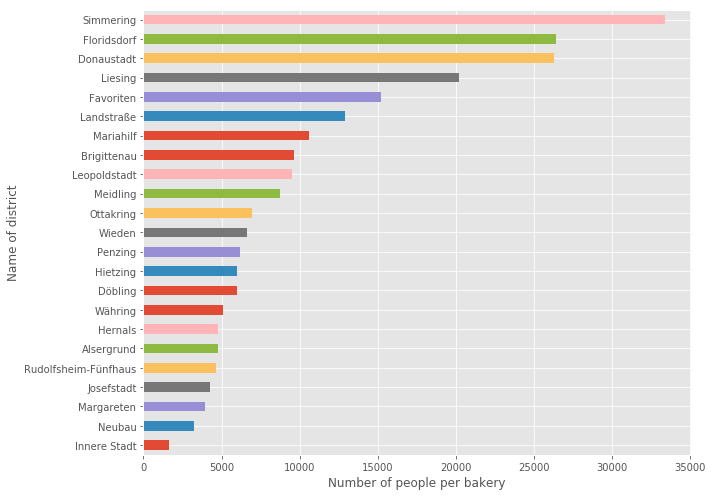

In [27]:
df_districts.sort_values('People per bakery', ascending=True).plot(kind='barh', x='Name', y='People per bakery', figsize=(10,7), legend=False)
plt.ylabel('Name of district')
plt.xlabel('Number of people per bakery')
plt.tight_layout()
plt.savefig('Num_bakeries.pdf')
plt.show()

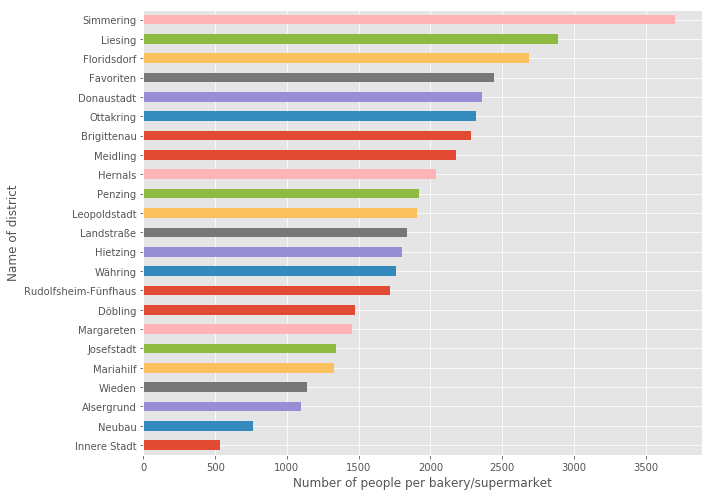

In [28]:
df_districts.sort_values('People per total', ascending=True).plot(kind='barh', x='Name', y='People per total', figsize=(10,7), legend=False)
plt.ylabel('Name of district')
plt.xlabel('Number of people per bakery/supermarket')
plt.tight_layout()
plt.savefig('Num_total.pdf')
plt.show()

It also makes sense to visualise this on a map:

In [29]:
map_vienna = folium.Map(location=[lat_vienna, lng_vienna], zoom_start=12, tiles='Stamen Toner')

#state_geo = os.path.join('data', 'us-states.json')

map_vienna.choropleth(
    geo_data='bezirksgrenzen_wien.json',
    name='people per bakery',
    data=df_districts,
    columns=['Code', 'People per bakery'],
    key_on='feature.properties.DISTRICT_CODE',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='People per bakery',
    reset=True
)

map_vienna.choropleth(
    geo_data='bezirksgrenzen_wien.json',
    name='people per supermarket/bakery',
    data=df_districts,
    columns=['Code', 'People per total'],
    key_on='feature.properties.DISTRICT_CODE',
    fill_color='RdBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='People per bakery/supermarket',
    reset=True
)

folium.LayerControl().add_to(map_vienna)

map_vienna

/home/julian/.conda/envs/tensorflow_gpuenv/lib/python3.6/site-packages/folium/folium.py:432: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


So far the analysis suggests 'Simmering' and 'Liesing', which are at the outskirts of the city, as good canditates for a more detailed search. Nevertheless the analysis has a weakness since it does not take into account movement of the people during the day (probably more people are in the center of the city during the day for work etc.). It was still interesting as an excercise.
For improvement one would be need further data on pedestrians , work during the day etc. ...